In [139]:
import os, sys
import numpy as np

import pandas as pd
from keras.layers import Input, Dense, Flatten,Activation
from keras.layers import Conv1D, MaxPooling1D,Dropout,LSTM
from keras.layers import Embedding

from tensorflow.keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences

from keras.utils import to_categorical

from numpy import zeros
from numpy import asarray

from keras.models import Sequential

from keras.layers import Dense
from keras.layers import Flatten

from keras.layers import Embedding

import matplotlib.pyplot as plt
%matplotlib inline
# fix random seed for reproducibility
np.random.seed(42)

### Reading  the Data

In [140]:
Data = pd.read_csv("train.csv")
Data_Test = pd.read_csv("test.csv")

In [141]:
Data.head()

,categories,converse
0,QUERIES FROM PHARMACY,please to verify instructions for drugname pat...
1,NEW APPOINTMENT,lmovm for patients mother to and schd rov trac...
2,OTHERS,labtype and insurance approval other incoming ...
3,OTHERS,clinical list changes medfusion secure electro...
4,MEDICATION RELATED,wants to wean off medication work phone name d...


In [142]:
Data_Test.head()

,id,converse
0,1,request to speak with rn no given patients ref...
1,2,patients husband ret name spouse for other pat...
2,3,fyi in his szs mom other he has an appointment...
3,4,Rx refill drugname from pharmacy name reason f...
4,5,need more time for testing dad is requesting a...


In [143]:
Data.shape

(48699, 2)

### Checking for Na's and Removing Na's

In [144]:
def find_remove_NAN(ds):
    print(ds.shape)
    mis_val = ds.isnull().sum()
    print(mis_val)
    ds.dropna(inplace=True)
    print(ds.shape)
    print(ds.info())

In [145]:
find_remove_NAN(Data)

(48699, 2)
categories     0
converse      32
dtype: int64
(48667, 2)
<class 'pandas.core.frame.DataFrame'>
Index: 48667 entries, 0 to 48698
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   categories  48667 non-null  object
 1   converse    48667 non-null  object
dtypes: object(2)
memory usage: 1.1+ MB
None


In [146]:
find_remove_NAN(Data_Test)

(8581, 2)
id          0
converse    4
dtype: int64
(8577, 2)
<class 'pandas.core.frame.DataFrame'>
Index: 8577 entries, 0 to 8580
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        8577 non-null   int64 
 1   converse  8577 non-null   object
dtypes: int64(1), object(1)
memory usage: 201.0+ KB
None


### Checking For Unique Categories

In [147]:
Data['categories'].unique()

array(['QUERIES FROM PHARMACY', 'NEW APPOINTMENT', 'OTHERS',
       'MEDICATION RELATED',
       'SHARING OF HEALTH RECORDS (FAX, E-MAIL, ETC.)', 'REFILL',
       'PRIOR AUTHORIZATION', 'RESCHEDULING', 'SYMPTOMS', 'LAB RESULTS',
       'FOLLOW UP ON PREVIOUS REQUEST', 'PROVIDER', 'CHANGE OF PROVIDER',
       'SHARING OF LAB RECORDS (FAX, E-MAIL, ETC.)',
       'QUERY ON CURRENT APPOINTMENT', 'RUNNING LATE TO APPOINTMENT',
       'CANCELLATION', 'CHANGE OF PHARMACY',
       'QUERIES FROM INSURANCE FIRM', 'JUNK', 'CHANGE OF HOSPITAL'],
      dtype=object)

categories
MEDICATION RELATED                               9010
NEW APPOINTMENT                                  8907
REFILL                                           8347
OTHERS                                           6232
SHARING OF HEALTH RECORDS (FAX, E-MAIL, ETC.)    3018
LAB RESULTS                                      2253
PROVIDER                                         1677
QUERIES FROM PHARMACY                            1464
RESCHEDULING                                     1382
SHARING OF LAB RECORDS (FAX, E-MAIL, ETC.)       1212
PRIOR AUTHORIZATION                              1043
SYMPTOMS                                         1021
CHANGE OF PROVIDER                                811
RUNNING LATE TO APPOINTMENT                       590
CANCELLATION                                      563
QUERY ON CURRENT APPOINTMENT                      559
FOLLOW UP ON PREVIOUS REQUEST                     304
CHANGE OF HOSPITAL                                127
QUERIES FROM INSU

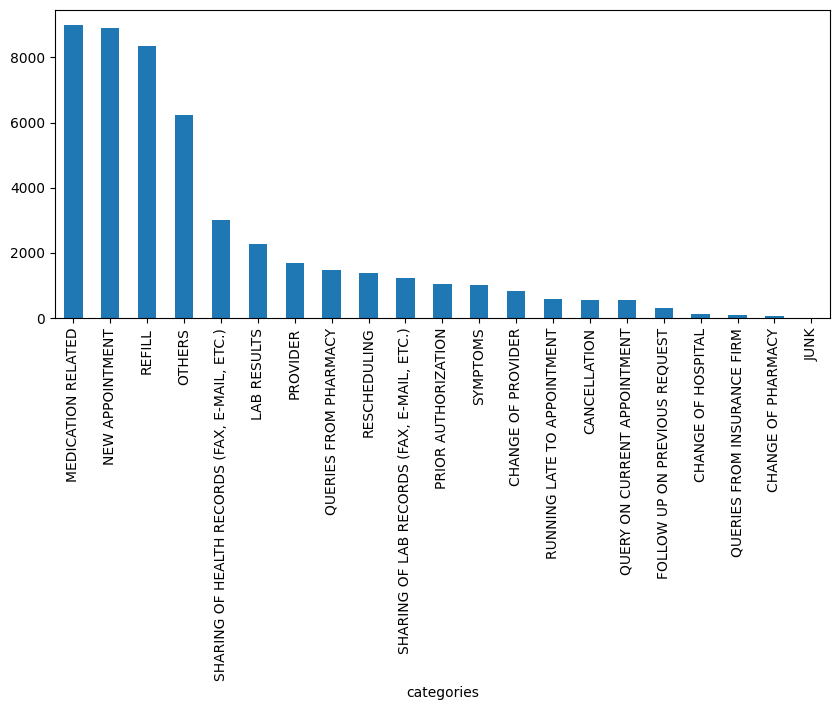

In [148]:
my_tags =['QUERIES FROM PHARMACY', 'NEW APPOINTMENT', 'OTHERS',
       'MEDICATION RELATED',
       'SHARING OF HEALTH RECORDS (FAX, E-MAIL, ETC.)', 'REFILL',
       'PRIOR AUTHORIZATION', 'RESCHEDULING', 'SYMPTOMS', 'LAB RESULTS',
       'FOLLOW UP ON PREVIOUS REQUEST', 'PROVIDER', 'CHANGE OF PROVIDER',
       'SHARING OF LAB RECORDS (FAX, E-MAIL, ETC.)',
       'QUERY ON CURRENT APPOINTMENT', 'RUNNING LATE TO APPOINTMENT',
       'CANCELLATION', 'CHANGE OF PHARMACY',
       'QUERIES FROM INSURANCE FIRM', 'JUNK', 'CHANGE OF HOSPITAL']
plt.figure(figsize=(10,4))
Data.categories.value_counts().plot(kind='bar');
print(Data.categories.value_counts())

In [149]:
Data = Data[Data['categories'].isin(Data.categories.value_counts().nlargest(5).index)]


(35514, 2)

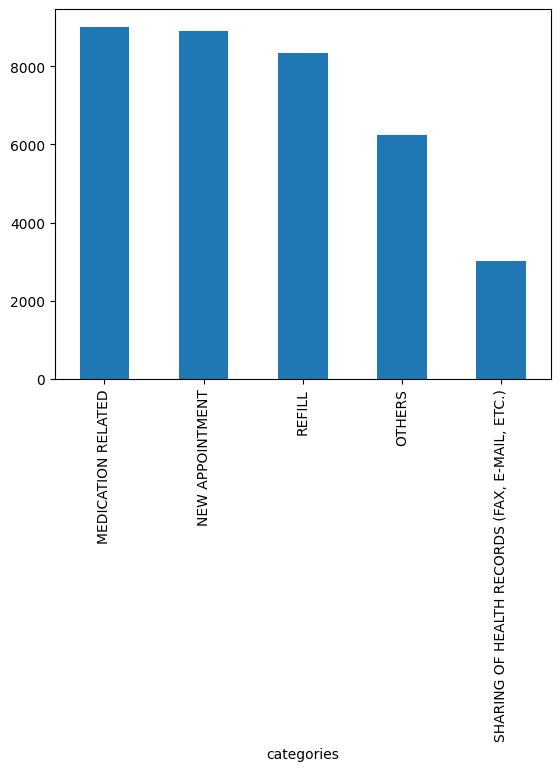

In [150]:
Data.categories.value_counts().plot(kind='bar');
Data.shape

### Label Encoding

In [151]:
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
Data['categories'] = labelencoder.fit_transform(Data['categories'])

### Stop Words Removal

In [152]:
#Remove stop words
from nltk.corpus import stopwords
stop = stopwords.words('english')
Data['converse'] = Data['converse'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))
Data['converse'].head()

1    lmovm patients mother schd rov tracy dominguez...
2    labtype insurance approval incoming name lpn c...
3    clinical list changes medfusion secure electro...
4    wants wean medication work phone name dad pati...
5    patient declining following name patient appoi...
Name: converse, dtype: object

In [153]:
Data['categories'].unique()

array([1, 2, 0, 4, 3])

In [154]:
Data_Test_converse = Data_Test['converse']

In [155]:
Data_Test_converse.head()
print(Data_Test_converse.shape)
print(type(Data_Test_converse))

(8577,)
<class 'pandas.core.series.Series'>


### Dividing the Data to docs and Labels

In [156]:
# define documents
docs = []
labels =[]
docs_Test =[]
for row in Data['converse']:
    docs.append(row)
for row_1 in Data['categories']:
    labels.append(row_1)
for row_t in Data_Test_converse:
    docs_Test.append(row)

In [157]:
print(docs[0:5])
print(labels[0:5])
print(Data_Test_converse[0:5])

['lmovm patients mother schd rov tracy dominguez kellee currie pm rhonda fanning', 'labtype insurance approval incoming name lpn clinical review cigna reason call details inform enough information provided patients approved home labtype whitney fax need filled sent questions please whintey rna follow routed wendy upchurch lisa mohamed rn auth obtained routed sleep schedulers tammy byrd fyi wendy upchurch clinical list changes', 'clinical list changes medfusion secure electronic message subject genetic testing hello jennifer wanted update stand far genetic testing concerned working building standard order testing testing administered ground floor building next door seen today contact order sent able obtain cost estimate look forward speaking soon angela cma end message body route responses ansmith notify read failure notice days message queued notanimer timephrase', 'wants wean medication work phone name dad patients dad request sw rn discuss patients care timephrase pm lmtcb regarding 

In [159]:
maxlength = len(Data.converse)
maxlength

35514

### Tokeninization

In [160]:
# Prepare tokenizer
t = Tokenizer()
t.fit_on_texts(docs)
#t1.fit_on_texts(docs_Test)
print (t.word_index)

vocab_size = len(t.word_index) + 1
#vocab_size1 = len(t1.word_index) + 1
print (vocab_size)
#print (vocab_size1)

{'patients': 1, 'patient': 2, 'mg': 3, 'timephrase': 4, 'drugname': 5, 'rx': 6, 'rn': 7, 'po': 8, 'please': 9, 'tabs': 10, 'rna': 11, 'pm': 12, 'appointment': 13, 'follow': 14, 'mom': 15, 'x': 16, 'md': 17, 'clinical': 18, 'list': 19, 'changes': 20, 'entered': 21, 'authorized': 22, 'labtype': 23, 'doctor': 24, 'prescription': 25, 'medication': 26, 'refill': 27, 'would': 28, 'message': 29, 'name': 30, 'phone': 31, 'pharmacy': 32, 'states': 33, 'like': 34, 'medications': 35, 'tab': 36, 'schedule': 37, 'updated': 38, 'new': 39, 'advise': 40, 'fax': 41, 'signed': 42, 'prn': 43, 'last': 44, 'completed': 45, 'pain': 46, 'request': 47, 'back': 48, 'give': 49, 'needs': 50, 'take': 51, 'sent': 52, 'know': 53, 'spoke': 54, 'q': 55, 'rov': 56, 'see': 57, 'hcl': 58, 'scheduled': 59, 'print': 60, 'days': 61, 'medicines': 62, 'need': 63, 'bid': 64, 'lpn': 65, 'note': 66, 'fill': 67, 'time': 68, 'work': 69, 'electronically': 70, 'used': 71, 'discuss': 72, 'provider': 73, 'wants': 74, 'one': 75, 'unde

In [161]:
# integer encode the documents
encoded_docs = t.texts_to_sequences(docs)
#encoded_docs_Test = t.texts_to_sequences(docs_Test)
encoded_docs_Test = t.texts_to_sequences(Data_Test_converse)
#Data_Test
#print(docs)
print(encoded_docs)
print(encoded_docs_Test )


[[541, 1, 416, 424, 56, 596, 721, 286, 327, 12, 274, 2052], [23, 194, 583, 313, 30, 65, 18, 452, 1300, 118, 110, 109, 529, 727, 106, 725, 1, 693, 131, 23, 6818, 41, 63, 321, 52, 172, 9, 14881, 11, 14, 3217, 392, 417, 95, 273, 7, 363, 958, 3217, 125, 1345, 1134, 704, 410, 392, 417, 18, 19, 20], [18, 19, 20, 97, 149, 145, 29, 127, 2282, 221, 1204, 171, 205, 336, 1986, 1332, 2282, 221, 472, 348, 2283, 2588, 91, 221, 221, 3324, 4402, 1612, 2283, 99, 3086, 123, 635, 144, 91, 52, 234, 981, 889, 8190, 780, 895, 1597, 446, 1088, 190, 147, 29, 150, 275, 282, 3382, 139, 156, 340, 320, 61, 29, 193, 14882, 4], [74, 1749, 26, 69, 31, 30, 198, 1, 198, 47, 349, 7, 72, 1, 207, 4, 12, 444, 143, 198, 499, 4, 12, 444, 16, 2, 198, 263, 1, 153, 2953, 622, 111, 44, 260, 394, 432, 1, 326, 386, 251, 3, 36, 10, 12, 1696, 185, 1950, 1, 111, 201, 1972, 73, 89, 4, 12, 28, 1341, 2042, 125, 3711, 23, 222, 255, 4522, 11166, 91, 174, 6398, 1951, 123, 72, 1950, 26, 17, 4, 12, 198, 82, 9, 91, 23, 73, 89, 4], [2, 3712, 

In [162]:
max_length = 500
padded_docs = pad_sequences(encoded_docs, maxlen=max_length, padding='post')
padded_docs_Test = pad_sequences(encoded_docs_Test, maxlen=max_length, padding='post')
print(padded_docs[0:5])

[[ 541    1  416 ...    0    0    0]
 [  23  194  583 ...    0    0    0]
 [  18   19   20 ...    0    0    0]
 [  74 1749   26 ...    0    0    0]
 [   2 3712  324 ...    0    0    0]]


In [163]:
labels = to_categorical(np.asarray(labels))

### Splitting the data 80 20

In [164]:
print(padded_docs.shape)
print(labels.shape)

(35514, 500)
(35514, 5)


In [165]:
#Performing train test split on the data
from sklearn.model_selection import train_test_split
X_train_val, X_test, y_train_val, y_test = train_test_split(padded_docs, labels, test_size=0.2, random_state=14, stratify = labels)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.2, random_state=14, stratify = y_train_val)

In [166]:
#To get the distribution in the target in train and test
print("Train set X:\t",X_train.shape)
print("Test set X:\t",X_test.shape)
print("Train set y:\t", y_train.shape)
print("Test set y:\t",y_test.shape)
print("-" * 50)
print("Validation set:\n","X:\t\t",X_val.shape)
print(" y:\t\t",y_val.shape)


Train set X:	 (22728, 500)
Test set X:	 (7103, 500)
Train set y:	 (22728, 5)
Test set y:	 (7103, 5)
--------------------------------------------------
Validation set:
 X:		 (5683, 500)
 y:		 (5683, 5)


# MLP Model

In [241]:
# define the model
model = Sequential()
model.add(Embedding(vocab_size,50))
model.add(Flatten())
model.add(Dense(5,activation='softmax'))


In [242]:
# compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [243]:
# fit the model
#model.fit(padded_docs, labels, epochs=50, verbose=0)
history  = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=20 ,verbose=1)

Epoch 1/20
711/711 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.6472 - loss: 0.9025 - val_accuracy: 0.8210 - val_loss: 0.4813
Epoch 2/20
711/711 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8649 - loss: 0.3758 - val_accuracy: 0.8138 - val_loss: 0.4921
Epoch 3/20
711/711 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9234 - loss: 0.2393 - val_accuracy: 0.8151 - val_loss: 0.5292
Epoch 4/20
711/711 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9612 - loss: 0.1434 - val_accuracy: 0.8084 - val_loss: 0.5666
Epoch 5/20
711/711 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9793 - loss: 0.0855 - val_accuracy: 0.8066 - val_loss: 0.6106
Epoch 6/20
711/711 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9884 - loss: 0.0542 - val_accuracy: 0.8031 - val_loss: 0.6520
Epoch 7/20
711/711 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9920 - loss: 0.0367 - val_accuracy: 0.8054 - val_loss: 0.7069
Epoch 8/20
711/711 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9932 - loss: 0.0288 - val_accuracy: 0.

In [244]:
# evaluate the model
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print('Accuracy: %f' % (accuracy*100))

Accuracy: 78.093761


In [245]:
Y_pred_test = model.predict(X_test)
print(Y_pred_test[0:5])

222/222 ━━━━━━━━━━━━━━━━━━━━ 0s 598us/step
[[6.5706991e-02 7.7729744e-01 1.5375823e-01 8.8634755e-04 2.3509716e-03]
 [3.0333627e-09 1.0000000e+00 4.4679123e-08 2.6219929e-10 3.9590589e-09]
 [9.9998951e-01 2.2780080e-13 1.8214785e-15 1.0470313e-05 2.6402583e-13]
 [3.6578517e-13 2.5852764e-16 4.4641772e-25 1.0000000e+00 2.0941675e-20]
 [2.3855923e-03 2.4436455e-04 9.8520678e-01 6.8734027e-03 5.2898293e-03]]


In [246]:
y_pred_Test =[]
for i in Y_pred_test:
    y_pred_Test.append(np.argmax(i))

print(y_pred_Test)

[1, 1, 0, 3, 2, 0, 3, 1, 3, 4, 3, 4, 0, 1, 1, 0, 0, 3, 2, 3, 3, 3, 2, 1, 2, 3, 2, 2, 0, 3, 1, 1, 1, 1, 0, 3, 2, 0, 2, 3, 2, 1, 3, 2, 2, 0, 2, 2, 0, 1, 3, 3, 1, 3, 0, 2, 3, 0, 0, 3, 1, 1, 2, 1, 0, 1, 3, 0, 3, 3, 1, 3, 0, 1, 0, 3, 0, 4, 0, 3, 2, 3, 1, 4, 4, 2, 1, 2, 0, 2, 3, 3, 1, 1, 2, 1, 1, 2, 0, 3, 4, 2, 1, 2, 2, 1, 3, 3, 0, 1, 1, 4, 2, 1, 1, 3, 2, 4, 0, 3, 1, 1, 0, 0, 1, 0, 0, 1, 2, 1, 1, 3, 0, 0, 3, 2, 1, 0, 3, 0, 0, 1, 0, 2, 3, 2, 3, 1, 3, 1, 1, 0, 1, 1, 3, 0, 2, 1, 1, 3, 0, 4, 3, 1, 1, 0, 3, 3, 2, 1, 0, 1, 4, 2, 3, 3, 0, 2, 1, 1, 2, 3, 3, 2, 0, 3, 2, 0, 2, 0, 0, 3, 3, 1, 0, 4, 0, 1, 1, 4, 1, 2, 2, 2, 1, 1, 0, 2, 3, 0, 0, 2, 3, 3, 2, 2, 0, 2, 0, 0, 1, 4, 0, 0, 1, 3, 3, 3, 4, 4, 2, 0, 0, 0, 0, 1, 3, 3, 0, 2, 0, 2, 0, 1, 2, 1, 1, 0, 1, 2, 2, 2, 1, 3, 0, 3, 3, 3, 3, 4, 1, 0, 4, 1, 1, 1, 3, 1, 3, 3, 4, 0, 2, 3, 1, 3, 2, 0, 3, 3, 0, 1, 1, 0, 0, 3, 3, 3, 1, 3, 2, 1, 3, 3, 3, 0, 4, 3, 0, 4, 2, 0, 1, 2, 1, 1, 1, 2, 3, 0, 0, 1, 1, 2, 0, 1, 0, 3, 1, 1, 3, 1, 2, 4, 4, 3, 0, 3, 1, 3, 1, 3, 0, 

In [247]:
Y_pred = model.predict(padded_docs_Test)
print(Y_pred[0:5])

269/269 ━━━━━━━━━━━━━━━━━━━━ 0s 577us/step
[[9.9998039e-01 8.6855636e-08 1.8890280e-05 4.2894698e-07 1.8699477e-07]
 [4.2811554e-02 2.6560773e-03 9.5439625e-01 3.6266134e-05 9.9935765e-05]
 [9.7118437e-01 2.7278077e-02 4.2612304e-04 1.1105513e-03 9.3983829e-07]
 [5.2753998e-13 2.4224049e-17 1.5103214e-16 1.0000000e+00 2.2899200e-17]
 [8.4052432e-01 1.1591383e-06 1.2230189e-01 1.9890314e-02 1.7282233e-02]]


In [248]:
type(Y_pred)

numpy.ndarray

In [249]:
y_pred =[]
for i in Y_pred:
    y_pred.append(np.argmax(i))

print(y_pred)

[0, 2, 0, 3, 0, 0, 0, 1, 2, 0, 1, 1, 0, 0, 0, 3, 0, 4, 1, 1, 0, 0, 1, 2, 4, 0, 3, 4, 1, 3, 2, 0, 4, 4, 2, 3, 4, 1, 3, 2, 0, 2, 4, 0, 3, 0, 1, 0, 0, 2, 3, 0, 2, 3, 3, 0, 2, 1, 2, 0, 1, 3, 1, 4, 3, 4, 1, 3, 0, 4, 0, 2, 3, 1, 0, 0, 1, 1, 0, 1, 0, 2, 0, 0, 0, 2, 0, 0, 3, 0, 0, 4, 1, 0, 3, 1, 3, 4, 1, 0, 2, 3, 1, 3, 0, 3, 4, 3, 2, 1, 2, 1, 0, 0, 0, 3, 3, 0, 1, 0, 1, 2, 0, 1, 1, 1, 0, 1, 0, 3, 4, 2, 1, 0, 3, 1, 1, 1, 2, 1, 1, 4, 0, 3, 3, 3, 1, 3, 1, 0, 0, 2, 3, 3, 1, 4, 3, 3, 0, 2, 1, 3, 1, 2, 0, 0, 3, 0, 1, 4, 1, 0, 4, 1, 0, 1, 2, 1, 4, 1, 1, 1, 3, 0, 1, 2, 1, 0, 0, 0, 2, 1, 0, 3, 1, 0, 0, 1, 2, 2, 0, 3, 1, 2, 0, 0, 3, 2, 0, 1, 3, 0, 4, 1, 4, 0, 1, 3, 1, 2, 0, 1, 3, 1, 0, 2, 4, 0, 3, 0, 4, 4, 0, 3, 0, 4, 0, 1, 3, 3, 2, 3, 0, 0, 0, 3, 2, 0, 3, 2, 3, 3, 2, 1, 1, 2, 1, 0, 0, 0, 1, 0, 3, 0, 4, 1, 1, 0, 3, 0, 4, 2, 0, 2, 3, 4, 0, 0, 3, 1, 1, 1, 0, 4, 2, 2, 3, 1, 0, 0, 0, 1, 2, 3, 0, 2, 3, 4, 2, 0, 0, 1, 2, 3, 2, 3, 1, 3, 3, 2, 0, 4, 1, 1, 1, 2, 1, 0, 1, 0, 1, 0, 1, 2, 1, 0, 3, 4, 2, 0, 1, 0, 0, 

In [250]:
op =labelencoder.inverse_transform(y_pred)
d = {'id': Data_Test['id'], 'categories': op}
df = pd.DataFrame(data=d)
df.head()

,id,categories
0,1,MEDICATION RELATED
1,2,OTHERS
2,3,MEDICATION RELATED
3,4,REFILL
4,5,MEDICATION RELATED


Accuracy: 78.093761
222/222 ━━━━━━━━━━━━━━━━━━━━ 0s 505us/step


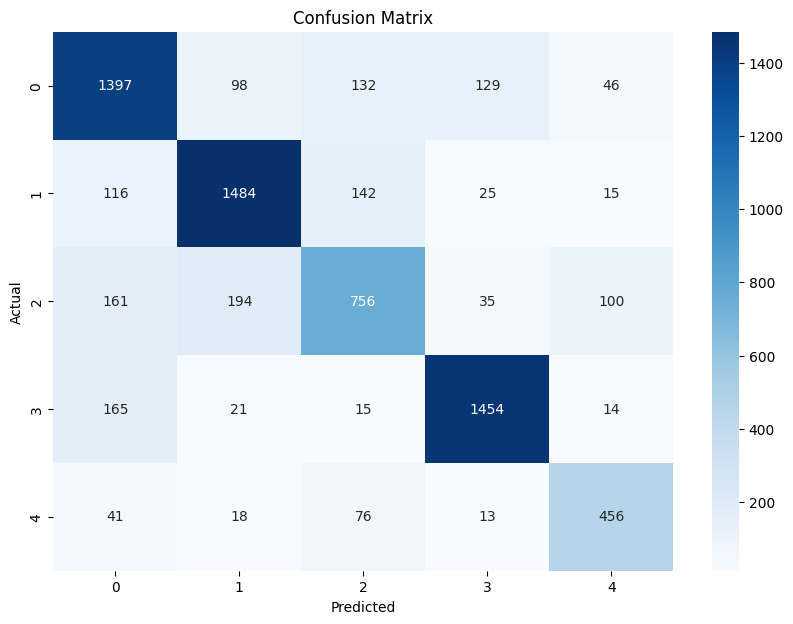

Classification Report:
               precision    recall  f1-score   support

           0       0.74      0.78      0.76      1802
           1       0.82      0.83      0.83      1782
           2       0.67      0.61      0.64      1246
           3       0.88      0.87      0.87      1669
           4       0.72      0.75      0.74       604

    accuracy                           0.78      7103
   macro avg       0.77      0.77      0.77      7103
weighted avg       0.78      0.78      0.78      7103



In [251]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print('Accuracy: %f' % (accuracy*100))


y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)


conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Plotting onfusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()

report = classification_report(y_true, y_pred_classes, target_names=[str(i) for i in range(5)], zero_division=0)
print('Classification Report:\n', report)

Accuracy: 99.916404
711/711 ━━━━━━━━━━━━━━━━━━━━ 0s 519us/step


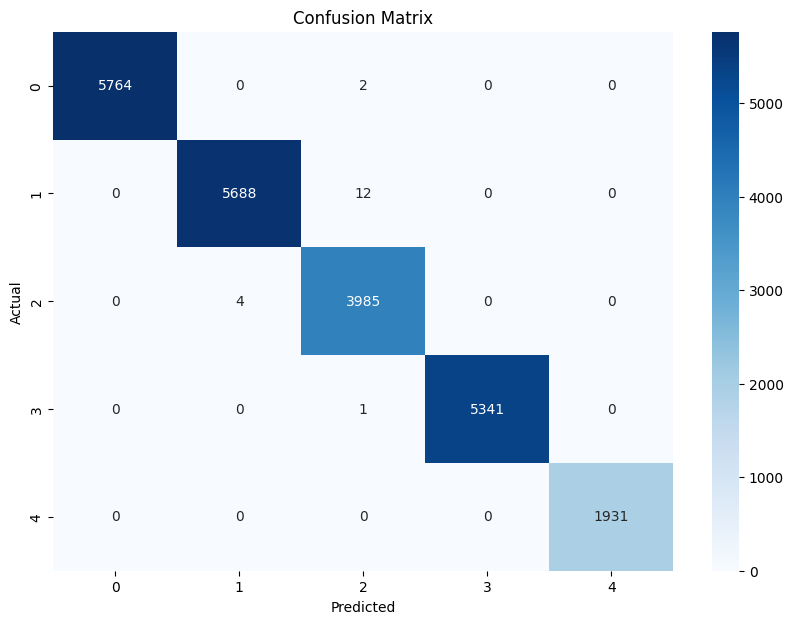

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5766
           1       1.00      1.00      1.00      5700
           2       1.00      1.00      1.00      3989
           3       1.00      1.00      1.00      5342
           4       1.00      1.00      1.00      1931

    accuracy                           1.00     22728
   macro avg       1.00      1.00      1.00     22728
weighted avg       1.00      1.00      1.00     22728



In [252]:
loss, accuracy = model.evaluate(X_train, y_train, verbose=0)
print('Accuracy: %f' % (accuracy*100))


y_pred = model.predict(X_train)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_train, axis=1)


conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Plotting onfusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()

report = classification_report(y_true, y_pred_classes, target_names=[str(i) for i in range(5)], zero_division=0)
print('Classification Report:\n', report)

In [253]:
from sklearn.metrics import roc_auc_score


y_pred_probs = model.predict(X_test)
auc_scores = roc_auc_score(y_test, y_pred_probs, multi_class='ovr')
print('AUC Scores:', auc_scores)

macro_auc = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='macro')
weighted_auc = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')

print('Macro AUC:', macro_auc)
print('Weighted AUC:', weighted_auc)

222/222 ━━━━━━━━━━━━━━━━━━━━ 0s 572us/step
AUC Scores: 0.9488210831403098
Macro AUC: 0.9488210831403098
Weighted AUC: 0.9478842110895835


In [254]:
from sklearn.metrics import roc_auc_score


y_train_probs = model.predict(X_train)
auc_scores_train = roc_auc_score(y_train, y_train_probs, multi_class='ovr')
print('AUC Scores Train:', auc_scores_train)

macro_auc = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='macro')
weighted_auc = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')

print('Macro AUC:', macro_auc)
print('Weighted AUC:', weighted_auc)

711/711 ━━━━━━━━━━━━━━━━━━━━ 0s 566us/step
AUC Scores Train: 0.9999806629026002
Macro AUC: 0.9488210831403098
Weighted AUC: 0.9478842110895835


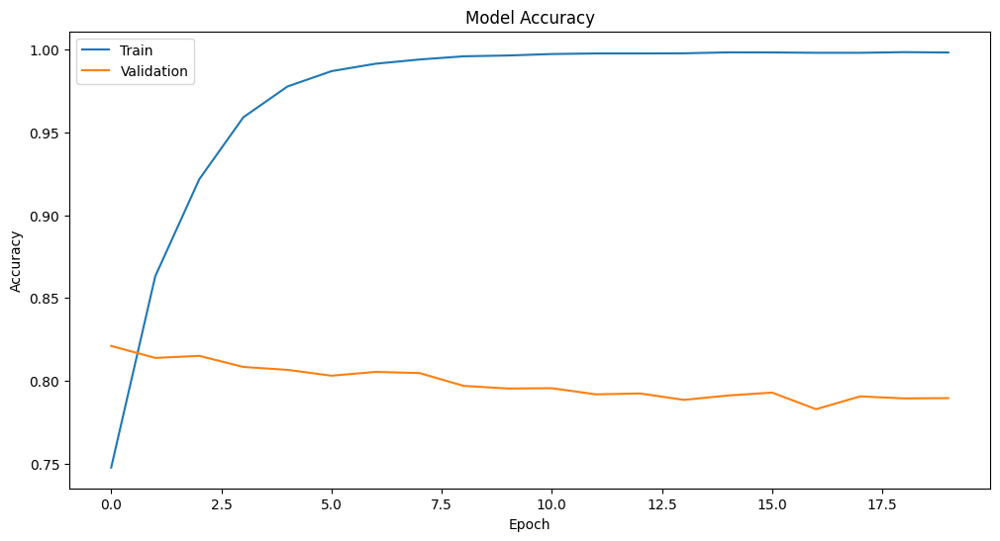

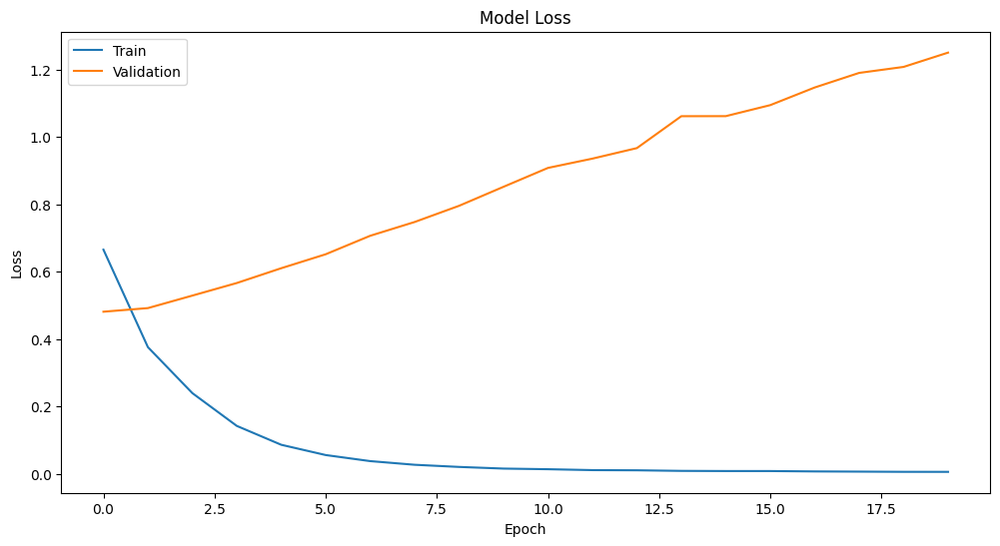

In [255]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


# KAN NETWORK

In [50]:
#uncomment if needed
#%pip install pykan
#%pip install torch

In [203]:
#uncomment in case of first compilation
from kan import KAN
import torch

In [204]:
print(y_train)

[[1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 0. 1. 0. 0.]
 ...
 [0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0.]]


In [205]:
y_train1 = np.argmax(y_train, axis = 1)
print(y_train1)

y_val1 = np.argmax(y_val, axis = 1)
print(y_val1)

y_test1 = np.argmax(y_test, axis = 1)
print(y_test1)



[0 1 2 ... 2 2 2]
[3 4 3 ... 3 1 1]
[2 1 0 ... 0 0 2]


In [206]:
# Count occurrences of each label
label_counts = np.bincount(y_train1)

# Display the counts
print("Label distribution in train set")
for label, count in enumerate(label_counts):
    print(f"Label {label} appears {count} times")
    
# Count occurrences of each label
label_counts = np.bincount(y_val1)

print("Label distribution in validation set")
# Display the counts
for label, count in enumerate(label_counts):
    print(f"Label {label} appears {count} times")

# Count occurrences of each label
label_counts = np.bincount(y_test1)

print("Label distribution in test set")
# Display the counts
for label, count in enumerate(label_counts):
    print(f"Label {label} appears {count} times")

Label distribution in train set
Label 0 appears 5766 times
Label 1 appears 5700 times
Label 2 appears 3989 times
Label 3 appears 5342 times
Label 4 appears 1931 times
Label distribution in validation set
Label 0 appears 1442 times
Label 1 appears 1425 times
Label 2 appears 997 times
Label 3 appears 1336 times
Label 4 appears 483 times
Label distribution in test set
Label 0 appears 1802 times
Label 1 appears 1782 times
Label 2 appears 1246 times
Label 3 appears 1669 times
Label 4 appears 604 times


In [207]:
y_train1 = y_train1.astype(np.int64)
y_val1 = y_val1.astype(np.int64)
y_test1 = y_test1.astype(np.int64)

dataset = {}
dataset['train_input'] = torch.from_numpy(X_train)
dataset['train_label'] = torch.from_numpy(y_train1).long()

dataset['val_input'] = torch.from_numpy(X_val)
dataset['val_label'] = torch.from_numpy(y_val1).long()

dataset['test_input'] = torch.from_numpy(X_test)
dataset['test_label'] = torch.from_numpy(y_test1).long()

In [208]:
print(dataset['train_input'].shape)
print(dataset['train_label'].shape)

print(dataset['val_input'].shape)
print(dataset['val_label'].shape)

print(dataset['test_input'].shape)
print(dataset['test_label'].shape)

torch.Size([22728, 500])
torch.Size([22728])
torch.Size([5683, 500])
torch.Size([5683])
torch.Size([7103, 500])
torch.Size([7103])


In [209]:
import keras

In [211]:
model = KAN(width=[500, 10, 5], grid = 3, k=3, seed = 2024)

In [212]:
def train_acc():
    return torch.mean((torch.argmax(model(dataset['train_input']), dim = 1) == dataset['train_label']).float())

def val_acc():
    return torch.mean((torch.argmax(model(dataset['val_input']), dim = 1) == dataset['val_label']).float())


In [61]:
results = model.train(dataset, opt = "LBFGS", steps = 10, metrics =(train_acc, val_acc), loss_fn=torch.nn.CrossEntropyLoss(), lamb = 0.01)  

description:   0%|                                                           | 0/10 [00:00<?, ?it/s]/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
train loss: 1.44e+00 | test loss: 1.54e+00 | reg: 3.11e+01 : 100%|█| 10/10 [1:42:15<00:00, 613.56s/i


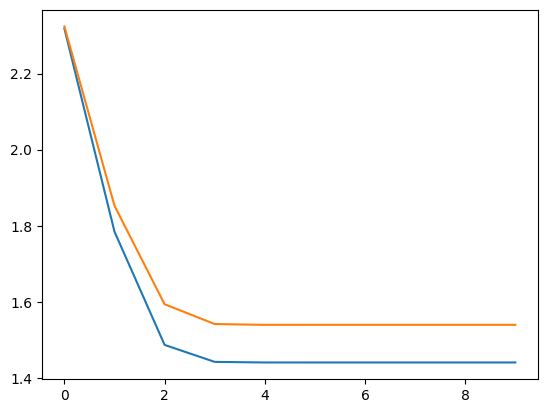

In [213]:
plt.plot(results['train_loss'])
plt.plot(results['test_loss'])

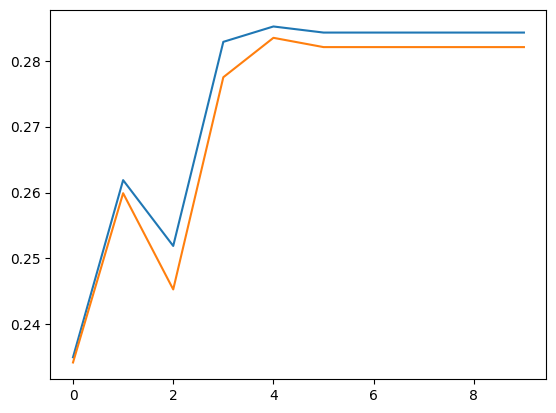

In [214]:
plt.plot(results['train_acc'])
plt.plot(results['val_acc'])

In [215]:
results['val_acc'][-1]

0.2820693254470825

In [216]:
results['train_acc'][-1]

0.2842749059200287

In [217]:
# from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix

# y_val_pred = torch.argmax(model(dataset['val_input']), dim=1).numpy()
# y_val_true = dataset['val_label'].numpy()


# precision = precision_score(y_val_true, y_val_pred, average='macro')
# recall = recall_score(y_val_true, y_val_pred, average='macro')
# f1 = f1_score(y_val_true, y_val_pred, average='macro')

# print(f"Precision: {precision}")
# print(f"Recall: {recall}")
# print(f"F1 Score: {f1}")

# # Confusion matrix
# conf_matrix = confusion_matrix(y_val_true, y_val_pred)
# print(f"Confusion Matrix:\n{conf_matrix}")

Precision: 0.2168218063181035
Recall: 0.22065161280379914
F1 Score: 0.19309315202325103
Confusion Matrix:
[[209 716 274 114 129]
 [ 74 863 284 127  77]
 [114 555 210  55  63]
 [210 610 276  93 147]
 [ 51 261  98  38  35]]


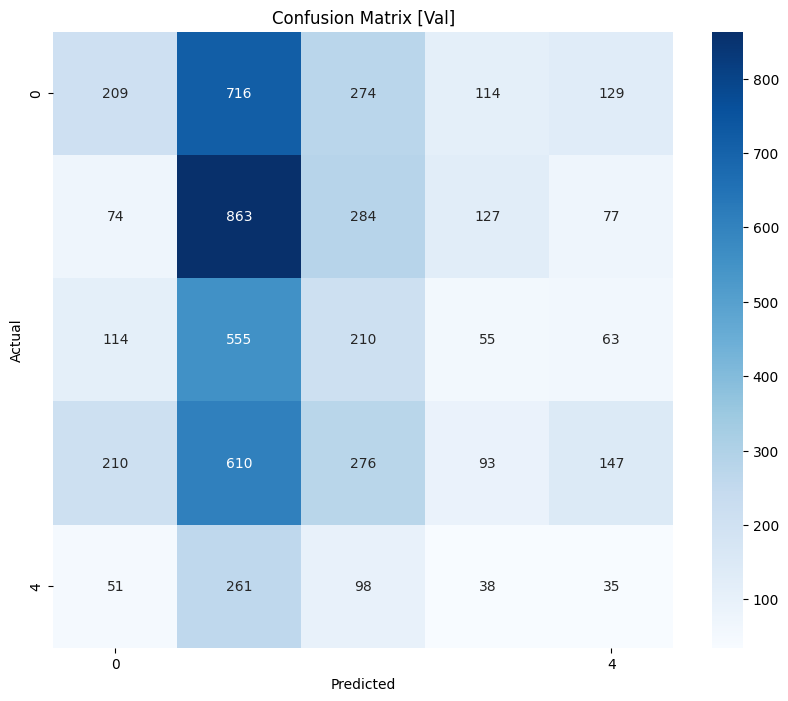

In [218]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# #Plot confusion matrix
# plt.figure(figsize=(10, 8))
# sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label, yticklabels=label)
# plt.ylabel('Actual')
# plt.xlabel('Predicted')
# plt.title('Confusion Matrix [Val]')
# plt.show()

Train Precision: 0.22019913529005394
Train Recall: 0.21716813534620938
Train F1 Score: 0.19100877063834315
Confusion Matrix [Train]:
[[ 798 2874 1175  412  507]
 [ 335 3376 1260  404  325]
 [ 413 2259  822  222  273]
 [ 858 2395 1149  423  517]
 [ 188 1095  363  150  135]]


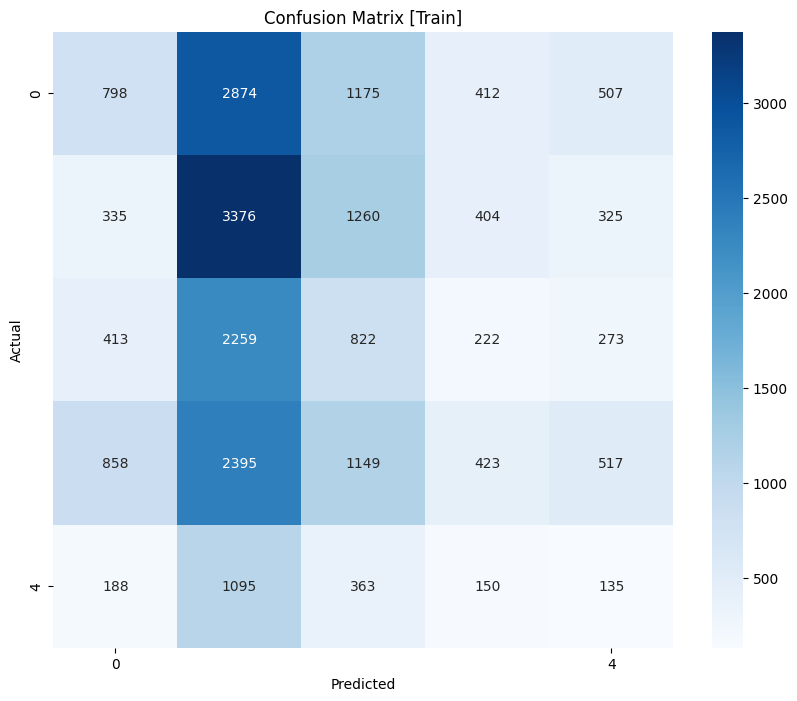

Test Precision: 0.22048058148517957
Test Recall: 0.21505623712853325
Test F1 Score: 0.1885640876975178
Confusion Matrix [Test]:
[[ 259  914  341  123  165]
 [ 107 1051  420  101  103]
 [ 130  686  268   83   79]
 [ 237  766  371  123  172]
 [  44  368  109   51   32]]


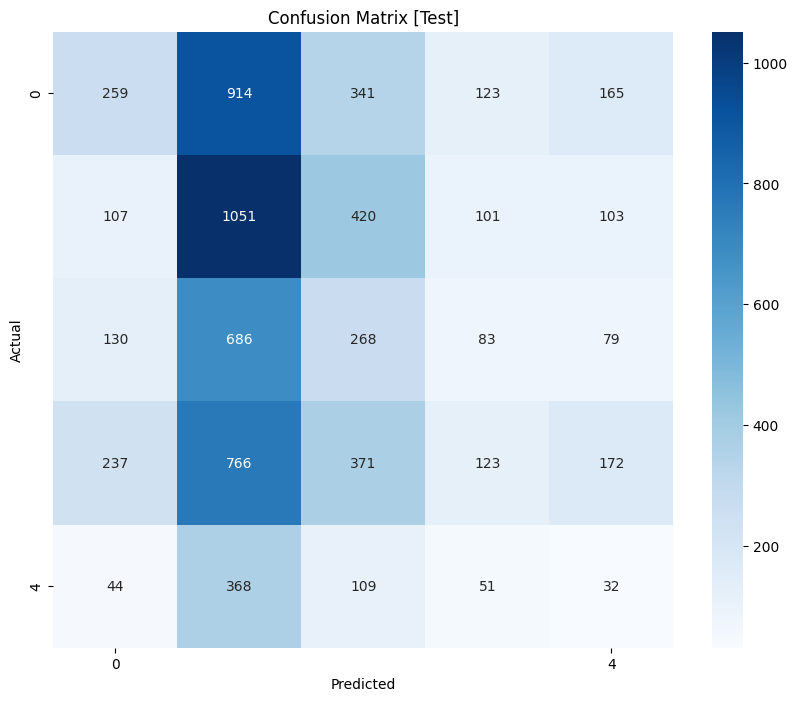

In [219]:
# Calculate and plot metrics and confusion matrix for the training set
y_train_pred = torch.argmax(model(dataset['train_input']), dim=1).numpy()
y_train_true = dataset['train_label'].numpy()

train_precision = precision_score(y_train_true, y_train_pred, average='macro')
train_recall = recall_score(y_train_true, y_train_pred, average='macro')
train_f1 = f1_score(y_train_true, y_train_pred, average='macro')

print(f"Train Precision: {train_precision}")
print(f"Train Recall: {train_recall}")
print(f"Train F1 Score: {train_f1}")

conf_matrix_train = confusion_matrix(y_train_true, y_train_pred)
print(f"Confusion Matrix [Train]:\n{conf_matrix_train}")

# Plot confusion matrix for the training set
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues', xticklabels=label, yticklabels=label)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix [Train]')
plt.show()

# Calculate and plot metrics and confusion matrix for the test set
y_test_pred = torch.argmax(model(dataset['test_input']), dim=1).numpy()
y_test_true = dataset['test_label'].numpy()

test_precision = precision_score(y_test_true, y_test_pred, average='macro')
test_recall = recall_score(y_test_true, y_test_pred, average='macro')
test_f1 = f1_score(y_test_true, y_test_pred, average='macro')

print(f"Test Precision: {test_precision}")
print(f"Test Recall: {test_recall}")
print(f"Test F1 Score: {test_f1}")

conf_matrix_test = confusion_matrix(y_test_true, y_test_pred)
print(f"Confusion Matrix [Test]:\n{conf_matrix_test}")

# Plot confusion matrix for the test set
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues', xticklabels=label, yticklabels=label)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix [Test]')
plt.show()

In [224]:
train_outputs = model(dataset['train_input'])
test_outputs = model(dataset['test_input'])

# Softmax to get probabilities
train_probs = torch.nn.functional.softmax(train_outputs, dim=1).detach().numpy()
test_probs = torch.nn.functional.softmax(test_outputs, dim=1).detach().numpy()

In [225]:
# True labels
y_train_true = dataset['train_label'].numpy()
y_test_true = dataset['test_label'].numpy()


train_roc_auc = roc_auc_score(y_train_true, train_probs, multi_class='ovo')
test_roc_auc = roc_auc_score(y_test_true, test_probs, multi_class='ovo')

print(f"Train ROC AUC KAN: {train_roc_auc}")
print(f"Test ROC AUC KAN: {test_roc_auc}")

Train ROC AUC KAN: 0.5068450857090563
Test ROC AUC KAN: 0.5022792549414936
